In [1]:
import os
import csv
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import tensorflow as tf
from keras import backend as K
from PIL import Image
import matplotlib.pyplot as plt
from keras.models import *
from keras.layers import Input, merge, Conv2D, MaxPooling2D, UpSampling2D, Dropout, Cropping2D, concatenate, Activation,Conv2DTranspose, multiply
from keras.layers.merge import concatenate,add
from keras.layers.normalization import BatchNormalization
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, History, ReduceLROnPlateau
from keras.callbacks import EarlyStopping
from keras.utils.generic_utils import get_custom_objects
from keras.utils import multi_gpu_model
from keras.models import Model


from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix

from keras.regularizers import l2

os.environ["CUDA_VISIBLE_DEVICES"]="0"

C:\Users\Owner5\Anaconda3\envs\kjb\lib\site-packages\tensorflow\python\framework\dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\Owner5\Anaconda3\envs\kjb\lib\site-packages\tensorflow\python\framework\dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\Owner5\Anaconda3\envs\kjb\lib\site-packages\tensorflow\python\framework\dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\Owner5\Anaconda3\envs\kjb\lib\site-packages\tensorflow\python\frame

In [2]:
os.getcwd()

'C:\\Users\\Owner5\\IMT\\pre-trained-unet\\5_folder_shuffle\\3_folder\\HE\\attention'

In [3]:
epsilon = K.epsilon()
gamma = 0
alpha = 0.6
beta = 0.6

  
def recall(y_target, y_pred):
    # clip(t, clip_value_min, clip_value_max) : clip_value_min~clip_value_max 이외 가장자리를 깎아 낸다
    # round : 반올림한다
    y_target_yn = K.round(K.clip(y_target, 0, 1)) # 실제값을 0(Negative) 또는 1(Positive)로 설정한다
    y_pred_yn = K.round(K.clip(y_pred, 0, 1)) # 예측값을 0(Negative) 또는 1(Positive)로 설정한다

    # True Positive는 실제 값과 예측 값이 모두 1(Positive)인 경우이다
    count_true_positive = K.sum(y_target_yn * y_pred_yn) 

    # (True Positive + False Negative) = 실제 값이 1(Positive) 전체
    count_true_positive_false_negative = K.sum(y_target_yn)

    # Recall =  (True Positive) / (True Positive + False Negative)
    # K.epsilon()는 'divide by zero error' 예방차원에서 작은 수를 더한다
    recall = count_true_positive / (count_true_positive_false_negative + K.epsilon())

    # return a single tensor value
    return recall


def precision(y_target, y_pred):
    # clip(t, clip_value_min, clip_value_max) : clip_value_min~clip_value_max 이외 가장자리를 깎아 낸다
    # round : 반올림한다
    y_pred_yn = K.round(K.clip(y_pred, 0, 1)) # 예측값을 0(Negative) 또는 1(Positive)로 설정한다
    y_target_yn = K.round(K.clip(y_target, 0, 1)) # 실제값을 0(Negative) 또는 1(Positive)로 설정한다

    # True Positive는 실제 값과 예측 값이 모두 1(Positive)인 경우이다
    count_true_positive = K.sum(y_target_yn * y_pred_yn) 

    # (True Positive + False Positive) = 예측 값이 1(Positive) 전체
    count_true_positive_false_positive = K.sum(y_pred_yn)

    # Precision = (True Positive) / (True Positive + False Positive)
    # K.epsilon()는 'divide by zero error' 예방차원에서 작은 수를 더한다
    precision = count_true_positive / (count_true_positive_false_positive + K.epsilon())

    # return a single tensor value
    return precision


def f1score(y_target, y_pred):
    _recall = recall(y_target, y_pred)
    _precision = precision(y_target, y_pred)
    # K.epsilon()는 'divide by zero error' 예방차원에서 작은 수를 더한다
    _f1score = ( 2 * _recall * _precision) / (_recall + _precision+ K.epsilon())
    
    # return a single tensor value
    return _f1score

def iou_coef(y_true, y_pred, smooth=1):
    intersection = K.sum(K.abs(y_true * y_pred), axis=[1,2,3])
    union = K.sum(y_true,[1,2,3])+K.sum(y_pred,[1,2,3])-intersection
    iou = K.mean((intersection + smooth) / (union + smooth), axis=0)
    return iou


def balanced_loss(y_true, y_pred):
    pt = y_pred * y_true + (1-y_pred) * (1-y_true)
    pt = K.clip(pt, epsilon, 1-epsilon)
    CE = -K.log(pt)
    BL = alpha * CE
    
    return K.sum(BL, axis=1)


def focal_loss(y_true, y_pred):
    pt = y_pred * y_true + (1-y_pred) * (1-y_true)
    pt = K.clip(pt, epsilon, 1-epsilon)
    CE = -K.log(pt)
    FL = alpha * K.pow(1-pt, gamma) * CE
    
    return K.sum(FL, axis=1)


def dice_coef(y_true, y_pred, smooth=0.001):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)


def dice_coef_loss(y_true, y_pred):
    return 1 - dice_coef(y_true, y_pred)


def cus_loss(y_true, y_pred):
    
    return (1 - beta) * focal_loss(y_true, y_pred) + beta * dice_coef_loss(y_true, y_pred)


def tversky_loss(y_true, y_pred):
    alpha = 0.5
    beta  = 0.5
    
    ones = K.ones(K.shape(y_true))
    p0 = y_pred      # proba that voxels are class i
    p1 = ones-y_pred # proba that voxels are not class i
    g0 = y_true
    g1 = ones-y_true
    
    num = K.sum(p0*g0, (0,1,2,3))
    den = num + alpha*K.sum(p0*g1,(0,1,2,3)) + beta*K.sum(p1*g0,(0,1,2,3))
    
    T = K.sum(num/den) # when summing over classes, T has dynamic range [0 Ncl]
    
    Ncl = K.cast(K.shape(y_true)[-1], 'float32')
    return Ncl-T


get_custom_objects().update({
    
    'cus_loss': cus_loss,
    'iou_coef' : iou_coef,
    'f1score' : f1score,
    'precision' : precision,
    'recall' : recall,
    'balanced_loss' : balanced_loss,
    'focal_loss' : focal_loss,
    'dice_coef' : dice_coef,
    'dice_coef_loss' : dice_coef_loss,
    'cus_loss' : cus_loss,
    'tversky_loss' : tversky_loss,
        
})

In [4]:
def Conv2D_block(input_layer, out_n_filters, kernel_size=[3,3], stride=[1,1], padding='same'):
    
    layer = input_layer
    
    for i in range(2):
        
        layer = Conv2D(out_n_filters, kernel_size, strides=stride, padding=padding)(layer)
        layer = BatchNormalization()(layer)
        layer = Activation('relu')(layer)        
        
    out_layer = layer
    
    return out_layer

def Up_and_Concate(down_layer, layer):
    
    input_channel = down_layer.get_shape().as_list()[3]
    output_channel = input_channel // 2
    
    up = UpSampling2D(size = (2,2))(down_layer)
    
#     my_concat = Lambda(lambda x: K.concatenate([x[0], x[1]], axis=4))

#     concate = my_concat([up, layer])

    concate = concatenate([up, layer])
    return concate
    
    
def attention_block_2d(x, g, inter_channel):


    theta_x = Conv2D(inter_channel, [1, 1], strides=[1, 1])(x)

    phi_g = Conv2D(inter_channel, [1, 1], strides=[1, 1])(g)

    f = Activation('relu')(add([theta_x, phi_g]))


    psi_f = Conv2D(1, [1, 1], strides=[1, 1])(f)

    rate = Activation('sigmoid')(psi_f)


    att_x = multiply([x, rate])

    return att_x
    
    
def attention_up_and_concate(down_layer, layer):
    in_channel = down_layer.get_shape().as_list()[3]

    # up = Conv2DTranspose(out_channel, [2, 2], strides=[2, 2])(down_layer)
    up = UpSampling2D(size=(2, 2))(down_layer)

    layer = attention_block_2d(x=layer, g=up, inter_channel=in_channel // 4)

    concate = concatenate([up, layer])
    
    return concate

In [5]:
def Att_U_Net_2D(img_w, img_h, n_label):
        
    inputs = Input((img_w, img_h, 1), dtype = 'float32')
    x = inputs
    depth = 5
    features = 32
    down_layer = []
    
    for i in range(depth):
        
        x = Conv2D_block(x, features)
        down_layer.append(x)
#         print(down_layer[i])
        x = MaxPooling2D(pool_size=[2, 2], strides=[2, 2])(x)

        features = features * 2
        
    x = Conv2D_block(x, features)
    
    for i in reversed(range(depth)):

        features = features // 2
        
        x = attention_up_and_concate(x, down_layer[i])
        x = Conv2D_block(x, features)
#         print(x)
    
    conv_last = Conv2D(n_label, kernel_size=[1, 1], padding='same')(x)
    conv_last = Activation('sigmoid')(conv_last)  
    
    outputs = conv_last
    
    model = Model(inputs = inputs, outputs = outputs)
    model.summary()
    
    return model

In [6]:
model = Att_U_Net_2D(512, 512 ,1)
# model.summary()

Instructions for updating:
Colocations handled automatically by placer.
Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 512, 512, 1)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 512, 512, 32) 320         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 512, 512, 32) 128         conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 512, 512, 32) 0           batch_normalization_1[0][0]      
____________________

In [7]:
IMG = np.load('C:/Users/Owner5/IMT/pre-trained-unet/5_folder_shuffle/3_folder/HE/fine_HE_IMG_3.npy') / 255
MSK = np.load('C:/Users/Owner5/IMT/pre-trained-unet/5_folder_shuffle/3_folder/HE/fine_HE_MASK_3.npy') * 1

In [8]:
print(IMG.shape, MSK.shape)

(791, 512, 512, 1) (791, 512, 512, 1)


In [9]:
IMG_1 = IMG.copy()
MSK_1 = MSK.copy()

(-0.5, 511.5, 511.5, -0.5)

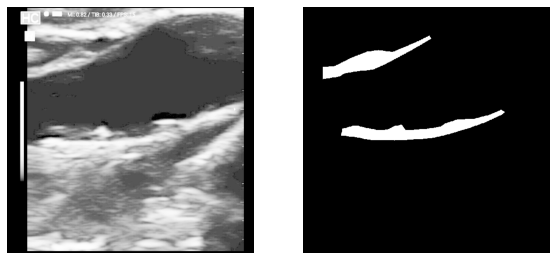

In [10]:
plt.figure(figsize=(15, 15))
plt.subplot(2,3,1)
plt.imshow(IMG_1[0,:,:,0],cmap='gray')
plt.axis('off')
plt.subplot(2,3,2)
plt.imshow(MSK_1[0,:,:,0],cmap='gray')
plt.axis('off')

In [11]:
train_image, test_image = train_test_split(IMG_1,test_size = 0.1, random_state =132)
train_label, test_label = train_test_split(MSK_1,test_size = 0.1, random_state =132)

train_image, validation_image = train_test_split(train_image,test_size = 0.1, random_state =132)
train_label, validation_label = train_test_split(train_label,test_size = 0.1, random_state =132)


# train_image = IMG_1[:702,:,:,:]
# train_label = MSK_1[:702,:,:,:]

# validation_image = IMG_1[702:780,:,:,:]
# validation_label = MSK_1[702:780,:,:,:]

# test_image = IMG_1[780:,:,:,:]
# test_label = MSK_1[780:,:,:,:]

print(train_image.shape)
print(train_label.shape)
print(validation_image.shape)
print(validation_label.shape)
print(test_image.shape)
print(test_label.shape)

(639, 512, 512, 1)
(639, 512, 512, 1)
(72, 512, 512, 1)
(72, 512, 512, 1)
(80, 512, 512, 1)
(80, 512, 512, 1)


In [12]:
# config = tf.ConfigProto()
# config.gpu_options.allow_growth = True
# session = tf.Session(config=config)

# model = multi_gpu_model(model,gpus=4)
model.compile(optimizer=Adam(lr=0.001
                            ), loss=dice_coef_loss, metrics=['accuracy', recall, precision, f1score, dice_coef])

In [13]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, verbose=1, min_delta=1e-8, min_lr=0.01)
earlystopper = EarlyStopping(monitor='val_loss',patience=30, verbose=1)
model_checkpoint = ModelCheckpoint('C:/Users/Owner5/IMT/pre-trained-unet/5_folder_shuffle/3_folder/HE/attention/fine_HE_IMG_3.h5', monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False)
#용이하게 하는곳 
callbacks_list = [reduce_lr, model_checkpoint, earlystopper]

In [14]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 5202937739585077938
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 20311727800
locality {
  bus_id: 1
  links {
  }
}
incarnation: 6507496512776687082
physical_device_desc: "device: 0, name: TITAN RTX, pci bus id: 0000:42:00.0, compute capability: 7.5"
]


In [15]:
# os.environ['CUDA_VISIBIABLE_DIVICE']='0'

In [16]:
# tf.device('/gpu:0')

In [17]:

print('Fitting model...')
print('-'*200)
hist = model.fit(train_image, train_label, batch_size=8, epochs=100, verbose=1, validation_data=(validation_image, validation_label), shuffle=True, callbacks=callbacks_list)# ->여기서는 트레인 라벨 O
#학습을 하는코드(fit)

Fitting model...
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Train on 639 samples, validate on 72 samples
Epoch 1/100
639/639 [==============================] - 51s 79ms/step - loss: 0.5982 - accuracy: 0.9438 - recall: 0.7630 - precision: 0.4311 - f1score: 0.5349 - dice_coef: 0.4021 - val_loss: 0.9081 - val_accuracy: 0.4957 - val_recall: 0.7554 - val_precision: 0.0514 - val_f1score: 0.0961 - val_dice_coef: 0.0919

Epoch 00001: val_loss improved from inf to 0.90814, saving model to C:/Users/Owner5/IMT/pre-trained-unet/5_folder_shuffle/3_folder/HE/attention/fine_HE_IMG_3.h5
Epoch 2/100
639/639 [==============================] - 37s 59ms/step - loss: 0.4025 - accuracy: 0.9738 - recall: 0.7272 - precision: 0.6057 - f1score: 0.6567 - dice_coef: 0.5975 - val_loss: 0.8895 - val_accuracy: 0.5322 - val_recall: 0.8294 - val_precision: 0.0603

In [18]:
print('-'*200)
print('predict test data')
print('-'*200)
imgs_mask_test = model.predict(test_image, batch_size=30, verbose=1)# predict 예측 -> 여기서는 테스트 라벨 x
# np.save('../result/npy/test_pred_att_dice_'+str(img_size)+'.npy', imgs_mask_test)
# print('-'*200)
# print('predict test data save done')
# print('-'*200)

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
predict test data
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
80/80 [==============================] - 8s 102ms/step


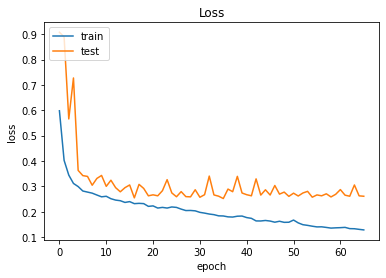

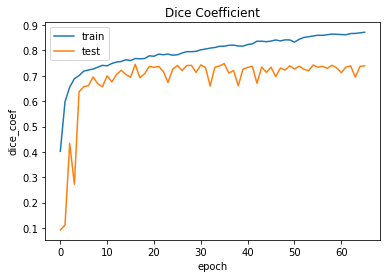

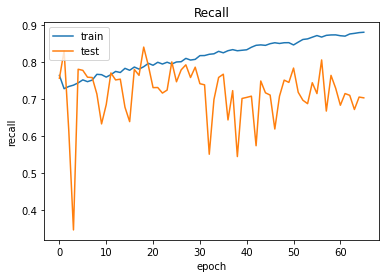

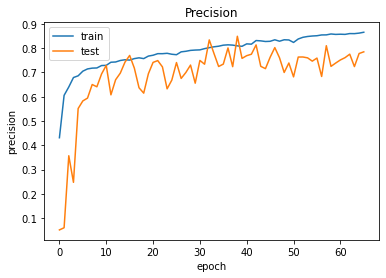

In [19]:
fig = plt.figure()
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


fig = plt.figure()
plt.plot(hist.history['dice_coef'])
plt.plot(hist.history['val_dice_coef'])
plt.title('Dice Coefficient')
plt.ylabel('dice_coef')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

fig = plt.figure()
plt.plot(hist.history['recall'])
plt.plot(hist.history['val_recall'])
plt.title('Recall')
plt.ylabel('recall')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

fig = plt.figure()
plt.plot(hist.history['precision'])
plt.plot(hist.history['val_precision'])
plt.title('Precision')
plt.ylabel('precision')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [20]:
def preds_Thresh(preds_test,Thresh_value):
    #저위에있는 프레딕트를 나온 결과가 확률(0~1)
    preds_mask = np.ndarray((len(test_image),512, 512, 1), dtype=np.float32)
  
    preds_mask0 = preds_test[:,:,:,0] > Thresh_value# thresh_value 
  
    preds_mask[:,:,:,0] = preds_mask0*1#
    
    return preds_mask

C:\Users\Owner5\Anaconda3\envs\kjb\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


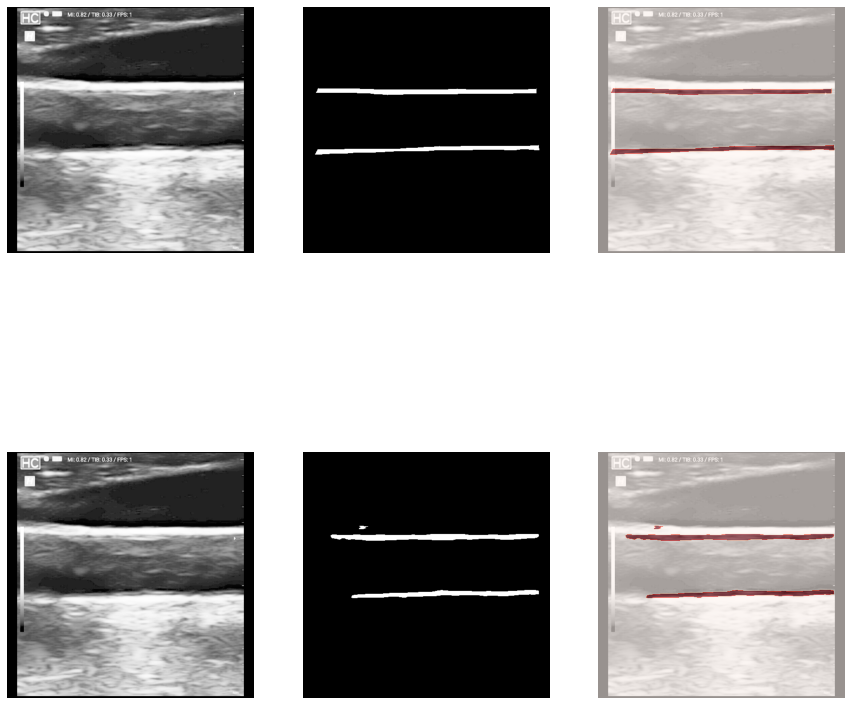

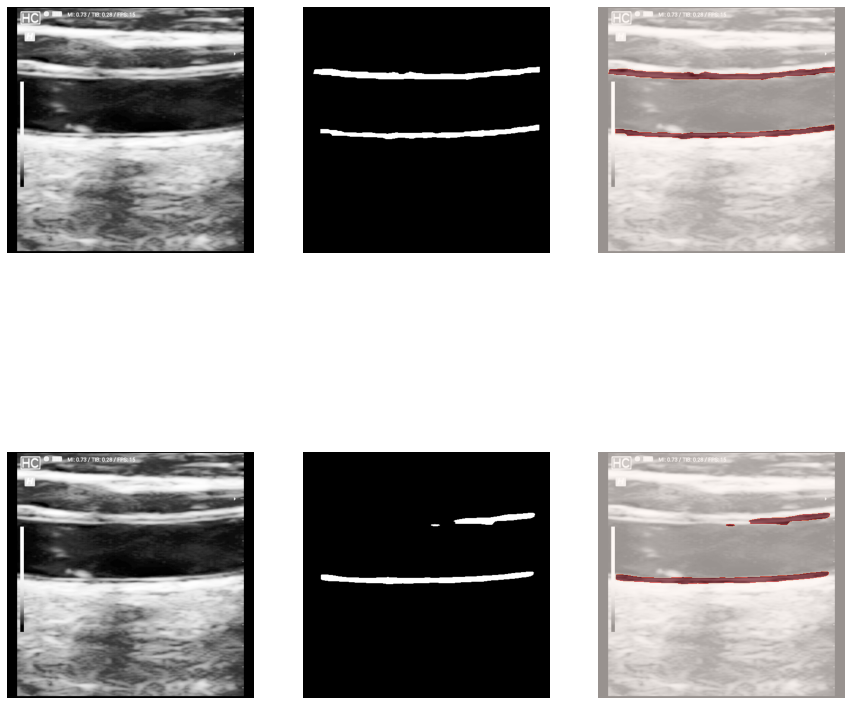

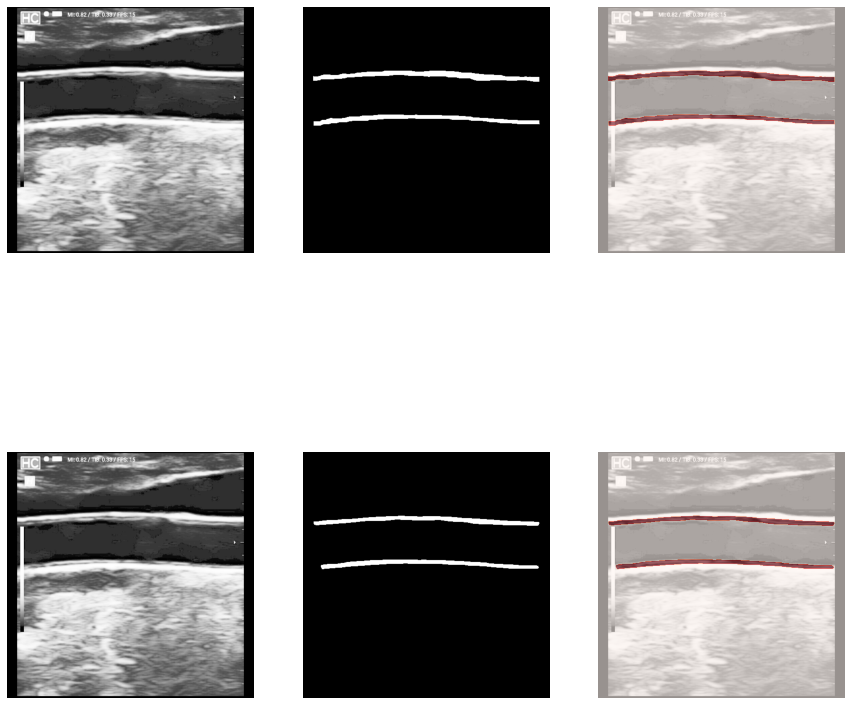

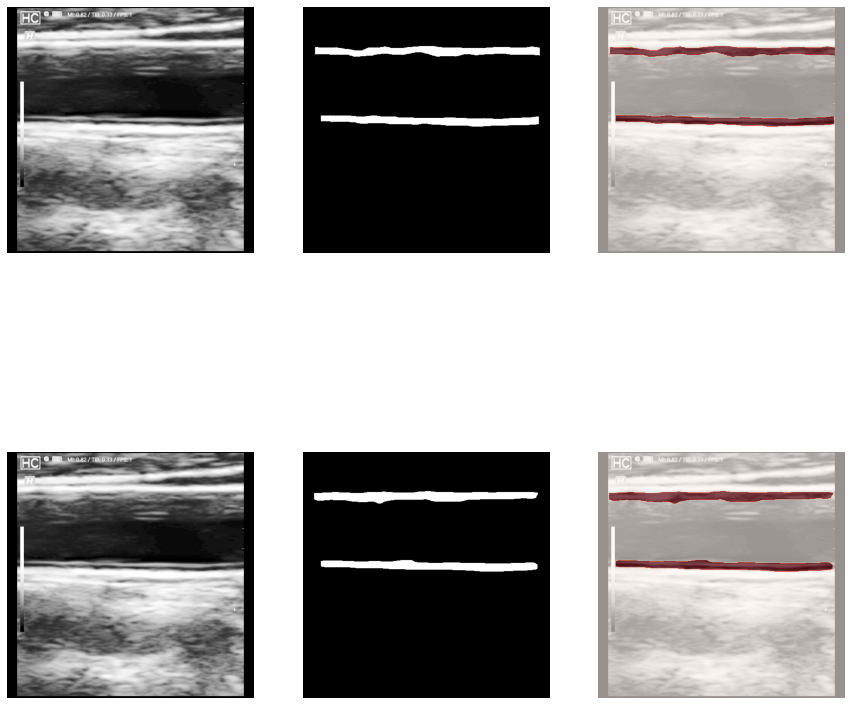

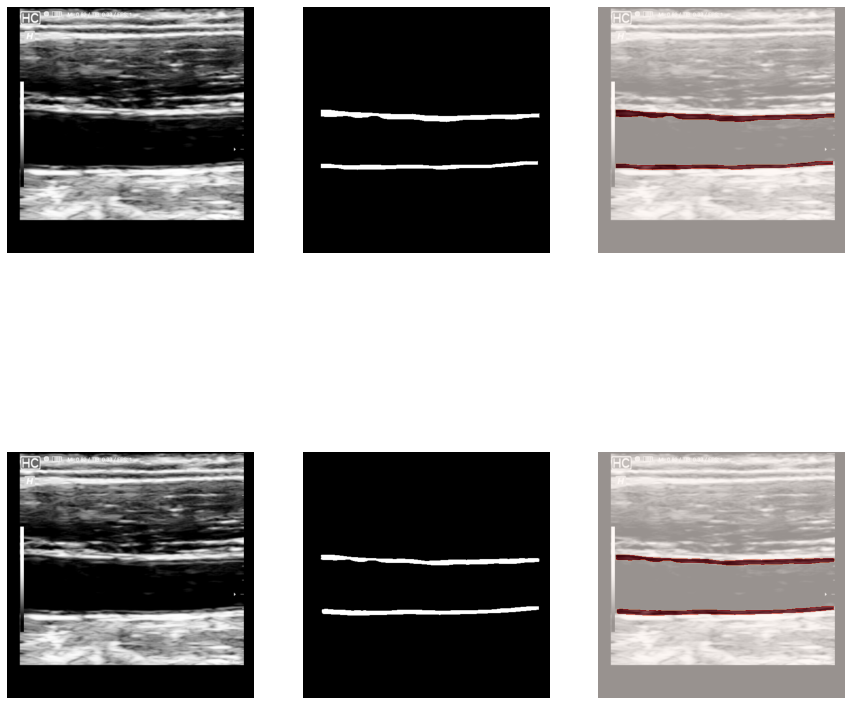

...

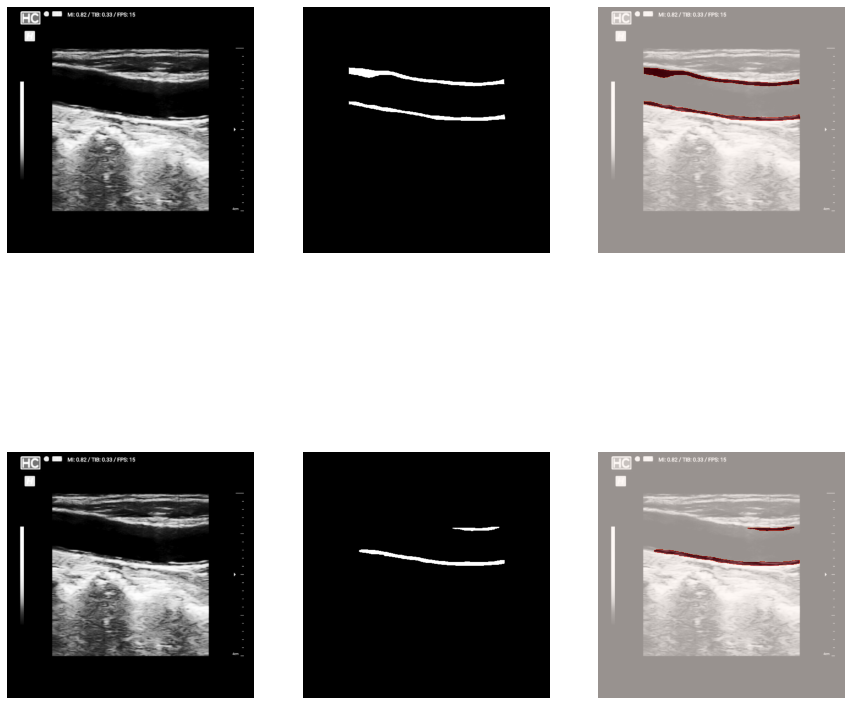

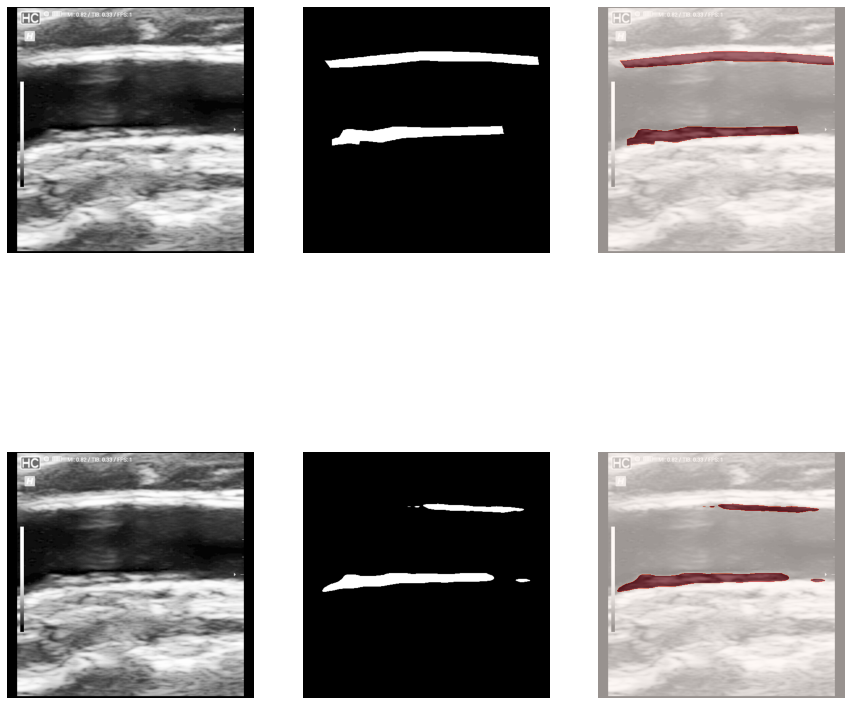

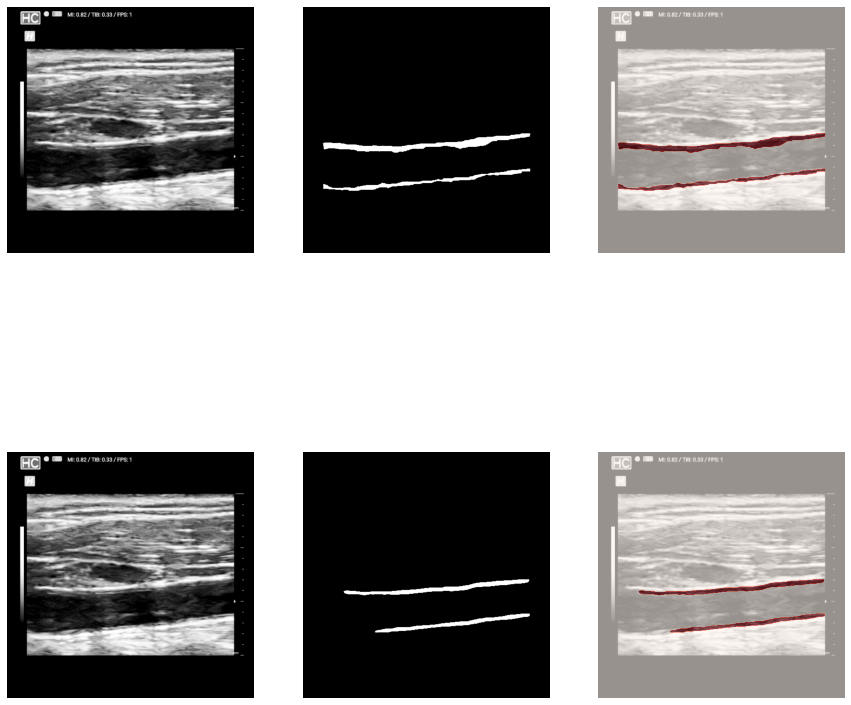

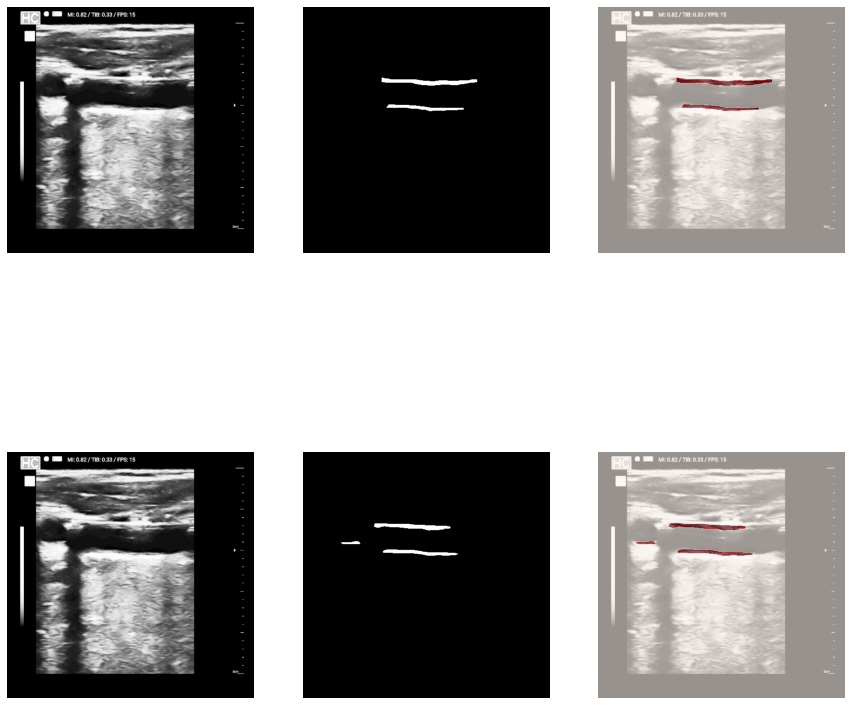

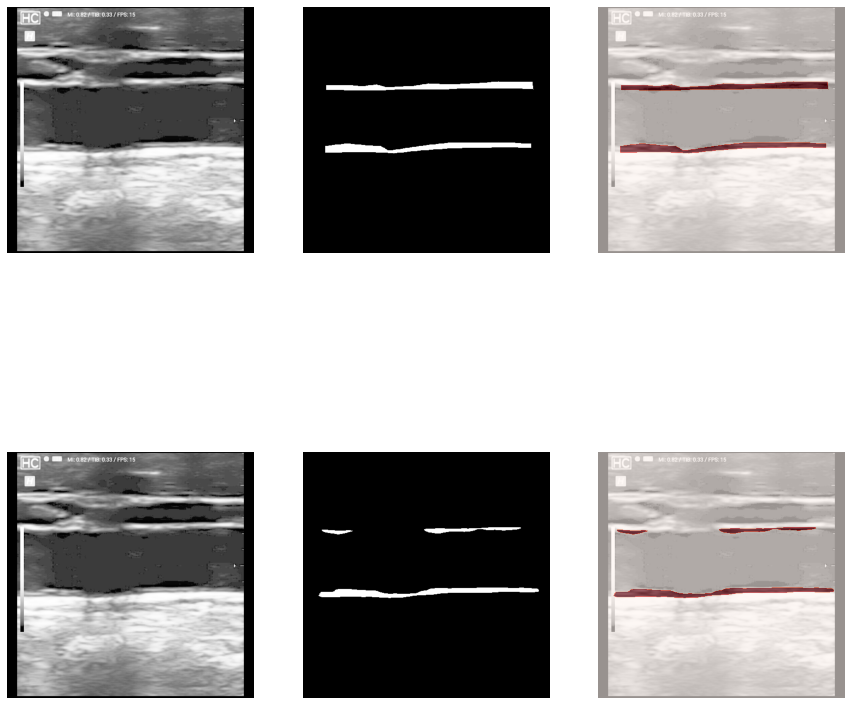

In [21]:
preds_mask = preds_Thresh(imgs_mask_test,0.5)# 0.5이상이면 1 , 아니면 0

for i in range(preds_mask.shape[0]):
    toto = i
    plt.figure(figsize=(15, 15))
    plt.subplot(2,3,1)
    plt.imshow(test_image[toto,:,:,0],cmap='gray')
    plt.axis('off')
    plt.subplot(2,3,2)
    plt.imshow(test_label[toto,:,:,0],cmap='gray')
    plt.axis('off')
    plt.subplot(2,3,3)
    plt.imshow(test_image[toto,:,:,0],cmap='gray')
    plt.imshow(test_label[toto,:,:,0],cmap='Reds' ,alpha=0.6)
    plt.axis('off')
    plt.subplot(2,3,4)
    plt.imshow(test_image[toto,:,:,0],cmap='gray')
    plt.axis('off')
    plt.subplot(2,3,5)
    plt.imshow(preds_mask[toto,:,:,0],cmap='gray')
    plt.axis('off')
    plt.subplot(2,3,6)
    plt.imshow(test_image[toto,:,:,0],cmap='gray')
    plt.imshow(preds_mask[toto,:,:,0],cmap='Reds' ,alpha=0.6)
    plt.axis('off')

In [22]:
preds_mask.shape

(80, 512, 512, 1)

In [23]:
np.save('C:/Users/Owner5/IMT/pre-trained-unet/5_folder_shuffle/3_folder/HE/attention/preds_mask_3.npy',preds_mask)

In [24]:
_loss, _acc, _precision, _recall, _f1score, _dice_coef = model.evaluate(test_image, test_label, batch_size=24, verbose=1)
print('loss: {:.3f}, accuracy: {:.3f}, precision: {:.3f}, recall: {:.3f}, f1score: {:.3f}, dice_coef:{:.3f}'.format(_loss, _acc*100, _precision*100, _recall*100, _f1score*100, _dice_coef*100))

80/80 [==============================] - 4s 55ms/step
loss: 0.261, accuracy: 98.247, precision: 68.256, recall: 79.367, f1score: 73.246, dice_coef:73.241


In [25]:
seg1 = preds_mask[:,:,:,0].flatten()
gt1 = test_label[:,:,:,0].flatten()

In [26]:
dice_list = []
recall_list = []
precision_list = []

for i in range(test_label.shape[0]):
    
    seg1 = preds_mask[i]
    gt1 = test_label[i]
    
    seg1_n = seg1 == 0
    seg1_t = seg1 == 1

    gt1_n = gt1 == 0
    gt1_t = gt1 == 1


    tp = np.sum(seg1_t&gt1_t)

    fp = np.sum(seg1_t&gt1_n)

    tn = np.sum(seg1_n&gt1_n)

    fn = np.sum(gt1_t&seg1_n)


    recall = tp / (tp + fn)
    recall_list.append(recall)
#     print('Sensitivity : ', sensitivity)


    precision = tp / (tp+fp)
    precision_list.append(precision)
#     print('Specificity : ', specificity)

    dice = (2*tp) / (2*tp + fp + fn)
    dice_list.append(dice)
#     print('DSC : ', dice)

In [27]:
precision_list = np.array(precision_list)
recall_list = np.array(recall_list)
dice_list = np.array(dice_list)

print('precision mean:',np.mean(precision_list),'precision std:',np.std(precision_list))
print('recall mean:',np.mean(recall_list),'recall std:',np.std(recall_list))
print('dice mean:',np.mean(dice_list),'dice std:',np.std(dice_list))


precision mean: 0.8029957384003653 precision std: 0.1345259429583513
recall mean: 0.6788154481519644 recall std: 0.18937862926719648
dice mean: 0.7176906977913335 dice std: 0.15180773322329047


In [28]:
dice_list = np.array(dice_list)

print(np.mean(dice_list),np.std(dice_list))

0.7176906977913335 0.15180773322329047


In [29]:
image_test_label_ravel = np.ravel(test_label)
image_test_label_ravel_cur = image_test_label_ravel.astype(np.bool)

In [30]:
predic_ravel = np.ravel(model.predict(test_image, batch_size=30))

predic_ravel = predic_ravel.astype(np.float32)

In [31]:

precision_, recall_, thresholds_ = precision_recall_curve(image_test_label_ravel_cur, predic_ravel)

average_precision_score = average_precision_score(image_test_label_ravel_cur, predic_ravel)

In [32]:



fpr_, tpr_, thresholds_1 = roc_curve(image_test_label_ravel_cur, predic_ravel)

roc_auc_score_ = roc_auc_score(image_test_label_ravel_cur, predic_ravel)

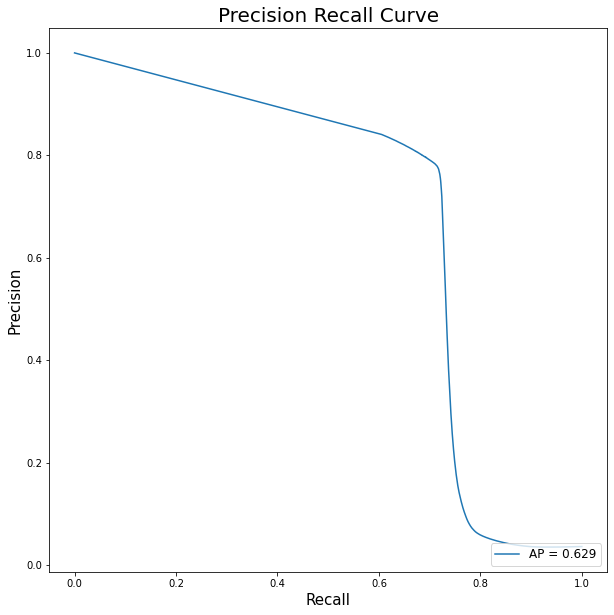

In [33]:
fig = plt.figure(figsize=(10,10))

plt.title('Precision Recall Curve', fontsize=20)

plt.xlabel('Recall', fontsize=15)
plt.ylabel('Precision', fontsize=15)

plt.plot(recall_, precision_, label='AP = %0.3f'%(average_precision_score))

plt.legend(loc='lower right', fontsize=12)
plt.show()
# fig.savefig('../result/fig/rck_dice_precision_recall_curve.png')

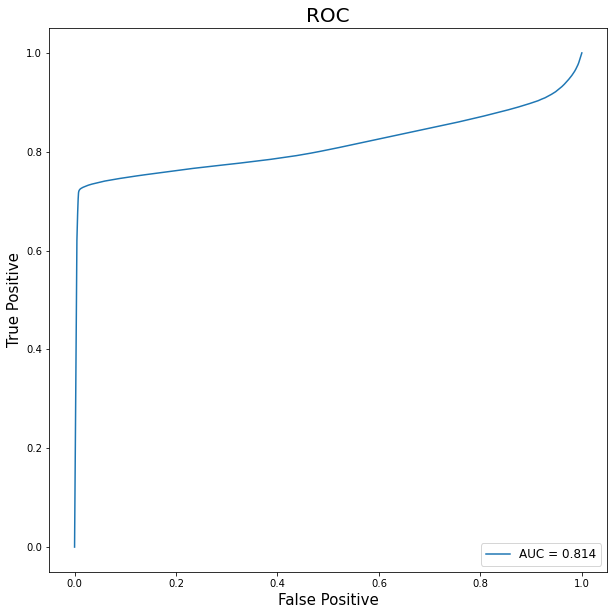

In [34]:
fig = plt.figure(figsize=(10,10))

plt.title('ROC', fontsize=20)

plt.xlabel('False Positive', fontsize=15)
plt.ylabel('True Positive', fontsize=15)

plt.plot(fpr_, tpr_, label='AUC = %0.3f'%roc_auc_score_)

plt.legend(loc='lower right', fontsize=12)
plt.show()
# fig.savefig('../result/fig/rck_dice_ROC.png')